In [2]:
!pip install uv
!uv pip install --system colpali_engine>=0.3.1 datasets huggingface_hub[hf_transfer] qdrant-client transformers>=4.45.0 stamina rich

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 112.3 MB/s eta 0:00:00
Using Python 3.11.12 environment at: /usr
Resolved 84 packages in 677ms
⠙ Preparing packages... (0/20)
⠙ Preparing packages... (0/20)
portalocker ------------------------------     0 B/17.99 KiB
⠙ Preparing packages... (0/20)
portalocker ------------------------------     0 B/17.99 KiB
dill       ------------------------------     0 B/113.53 KiB
⠙ Preparing packages... (0/20)
portalocker ------------------------------     0 B/17.99 KiB
dill       ------------------------------ 14.93 KiB/113.53 KiB
⠙ Preparing packages... (0/20)
portalocker ------------------------------ 14.91 KiB/17.99 KiB
dill       ------------------------------ 14.93 KiB/113.53 KiB
⠙ Preparing packages... (0/20)
portalocker ------------------------------ 14.91 KiB/17.99 KiB
dill       ------------------------------ 14.93 KiB/113.53 KiB
fsspec     ------------------------------     0 B/189.08 KiB
⠙ Preparing packages... (0/20)
portalocker

In [ ]:
import os
import torch
import numpy as np
from qdrant_client import QdrantClient
from qdrant_client.http import models
from tqdm import tqdm
from datasets import load_dataset


In [ ]:
os.environ["HF_HUB_ENABLE_HF_TRANSFER"] = "1"

https://huggingface.co/datasets/hwyin04/pdf-test

In [ ]:
dataset = load_dataset("hwyin04/pdf-test",split='train')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Resolving data files:   0%|          | 0/20 [00:00<?, ?it/s]

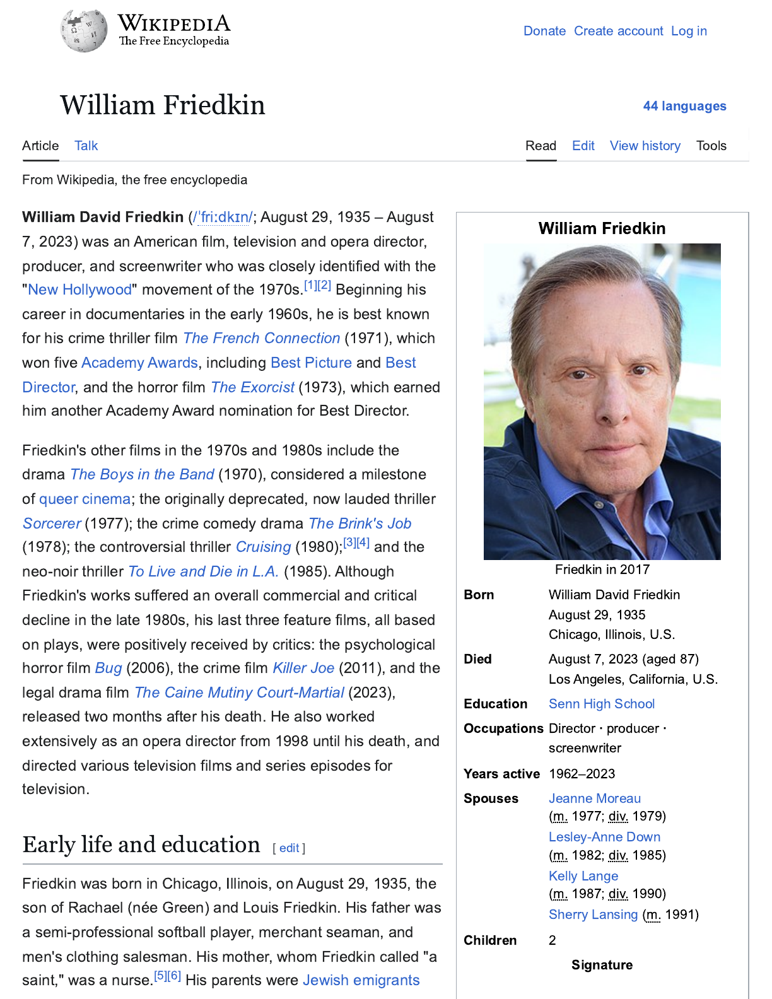

In [ ]:
dataset[0]['image']

In [ ]:
qdrant_client = QdrantClient(
    ":memory:"
)  # Use ":memory:" for in-memory database or "path/to/db" for persistent storage

In [ ]:
from colpali_engine.models import ColPali, ColPaliProcessor

colpali_model = ColPali.from_pretrained(
    "vidore/colpali-v1.2",
    torch_dtype=torch.bfloat16,
    device_map="cuda:0",  # or "mps" if on Apple Silicon
)
colpali_processor = ColPaliProcessor.from_pretrained("vidore/colpaligemma-3b-pt-448-base")

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [ ]:
sample_image = dataset[0]["image"]
with torch.no_grad():
    sample_batch = colpali_processor.process_images([sample_image]).to(
        colpali_model.device
    )
    sample_embedding = colpali_model(**sample_batch)

In [ ]:
sample_embedding

tensor([[[-0.1768,  0.0933, -0.0688,  ..., -0.1187, -0.1914,  0.0928],
         [-0.1982,  0.0947, -0.0718,  ..., -0.1357, -0.1992,  0.0649],
         [ 0.0425,  0.1201,  0.0898,  ..., -0.1318, -0.1826,  0.0114],
         ...,
         [-0.0913,  0.0486,  0.1396,  ...,  0.0011,  0.1108,  0.0698],
         [-0.1177,  0.1050,  0.1260,  ..., -0.0038, -0.0178, -0.1104],
         [-0.0654,  0.1387,  0.2285,  ...,  0.0364, -0.1128, -0.1924]]],
       device='cuda:0', dtype=torch.bfloat16)

In [ ]:
collection = 'demo'

In [ ]:
vector_params = models.VectorParams(
    size=128,
    distance=models.Distance.COSINE,
    multivector_config=models.MultiVectorConfig(
        comparator=models.MultiVectorComparator.MAX_SIM
    ),
)
print(vector_params)

size=128 distance=<Distance.COSINE: 'Cosine'> hnsw_config=None quantization_config=None on_disk=None datatype=None multivector_config=MultiVectorConfig(comparator=<MultiVectorComparator.MAX_SIM: 'max_sim'>)


In [ ]:
scalar_quant = models.ScalarQuantizationConfig(
    type=models.ScalarType.INT8,
    quantile=0.99,
    always_ram=True
)

In [ ]:
qdrant_client.recreate_collection(
    collection_name=collection,  # the name of the collection
    on_disk_payload=True,  # store the payload on disk
    optimizers_config=models.OptimizersConfigDiff(
        indexing_threshold=10
    ),  # it can be useful to swith this off when doing a bulk upload and then manually trigger the indexing once the upload is done
    vectors_config=models.VectorParams(
        size=128,
        distance=models.Distance.COSINE,
        multivector_config=models.MultiVectorConfig(
            comparator=models.MultiVectorComparator.MAX_SIM
        ),
        quantization_config=models.ScalarQuantization(
            scalar=models.ScalarQuantizationConfig(
                type=models.ScalarType.INT8,
                quantile=0.99,
                always_ram=True,
            ),
        ),
    ),
)

<ipython-input-13-1c8ca0d4b7bb>:1: DeprecationWarning: `recreate_collection` method is deprecated and will be removed in the future. Use `collection_exists` to check collection existence and `create_collection` instead.
  qdrant_client.recreate_collection(


True

We use the stamina library to enable retries in case of network issues (I didn’t have any issues with the in-memory client, but having this in place can be useful if you are doing a large upload).

In [ ]:
import stamina

@stamina.retry(on=Exception, attempts=3)
def upsert_to_qdrant(batch):
    try:
        qdrant_client.upsert(
            collection_name=collection,
            points=points,
            wait=False,
        )
    except Exception as e:
        print(f"Error during upsert: {e}")
        return False
    return True



In [ ]:
batch_size = 6

with tqdm(total=len(dataset),desc='Indexing Progress') as pbar:
  for i in range(0, len(dataset),batch_size):
    batch = dataset[i:i+batch_size]

    images = batch["image"]

    # Process and encode images
    with torch.no_grad():
        batch_images = colpali_processor.process_images(images).to(
            colpali_model.device
        )
        image_embeddings = colpali_model(**batch_images)

    # Prepare points for QDrant
    points = []
    for j, embedding in enumerate(image_embeddings):
      # Convert the embedding to a list vectors
      multivector = embedding.cpu().float().numpy().tolist()
      points.append(
          models.PointStruct(
              id=i+j, # index as ID
              vector=multivector,
              payload={
                  'source':'internet archive'
              }, # can add other metadata
          )
      )
      # Upload Points to Qdrant
      try:
        upsert_to_qdrant(points)
      except Exception as e:
        print(f"Error during upsert: {e}")
        continue

      pbar.update(batch_size)

print("Indexing Complete")



Indexing Progress: 120it [01:02,  1.92it/s]

Indexing Complete


In [ ]:
from rich import print as r_print

collection = qdrant_client.get_collection(collection)
r_print(collection)

CollectionInfo(
    status=<CollectionStatus.GREEN: 'green'>,
    optimizer_status=<OptimizersStatusOneOf.OK: 'ok'>,
    vectors_count=None,
    indexed_vectors_count=0,
    points_count=20,
    segments_count=1,
    config=CollectionConfig(
        params=CollectionParams(
            vectors=VectorParams(
                size=128,
                distance=<Distance.COSINE: 'Cosine'>,
                hnsw_config=None,
                quantization_config=ScalarQuantization(
                    scalar=ScalarQuantizationConfig(
                        type=<ScalarType.INT8: 'int8'>,
                        quantile=0.99,
                        always_ram=True
                    )
                ),
                on_disk=None,
                datatype=None,
                multivector_config=MultiVectorConfig(comparator=<MultiVectorComparator.MAX_SIM: 'max_sim'>)
            ),
            shard_number=None,
            sharding_method=None,
            replication_factor=None,
            write_consistency_factor=None,
            read_fan_out_factor=None,
            on_disk_payload=None,
            sparse_vectors=None
        ),
        hnsw_config=HnswConfig(
            m=16,
            ef_construct=100,
            full_scan_threshold=10000,
            max_indexing_threads=0,
            on_disk=None,
            payload_m=None
        ),
        optimizer_config=OptimizersConfig(
            deleted_threshold=0.2,
            vacuum_min_vector_number=1000,
            default_segment_number=0,
            max_segment_size=None,
            memmap_threshold=None,
            indexing_threshold=20000,
            flush_interval_sec=5,
            max_optimization_threads=1
        ),
        wal_config=WalConfig(wal_capacity_mb=32, wal_segments_ahead=0),
        quantization_config=None,
        strict_mode_config=None
    ),
    payload_schema={}
)

In [ ]:
qdrant_client.scroll(collection_name='demo', limit=5)

([Record(id=0, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
  Record(id=1, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
  Record(id=2, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
  Record(id=3, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
  Record(id=4, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None)],
 5)

In [ ]:
query_text = "Unrealized Project"
with torch.no_grad():
    batch_query = colpali_processor.process_queries([query_text]).to(
        colpali_model.device
    )
    query_embedding = colpali_model(**batch_query)
query_embedding

tensor([[[ 1.6016e-01, -2.8931e-02,  1.0352e-01,  ..., -2.7344e-02,
          -6.9336e-02, -3.4668e-02],
         [ 5.8350e-02, -1.5723e-01, -4.1771e-04,  ...,  1.2695e-01,
          -2.5757e-02,  3.8574e-02],
         [ 4.9072e-02, -1.1035e-01,  7.4219e-02,  ...,  5.4688e-02,
           1.5442e-02,  3.9062e-02],
         ...,
         [ 3.2959e-02, -8.6426e-02, -2.7344e-02,  ..., -4.1992e-02,
           1.1730e-04,  8.9355e-02],
         [ 2.9907e-02, -8.3008e-02, -3.5156e-02,  ..., -4.2969e-02,
          -5.1270e-03,  8.7891e-02],
         [ 1.0400e-01, -8.9844e-02,  4.8828e-02,  ...,  3.4912e-02,
           5.8350e-02,  4.5898e-02]]], device='cuda:0', dtype=torch.bfloat16)

In [ ]:
query_embedding[0].shape

torch.Size([17, 128])

In [ ]:
# Convert the query embedding to a list of vectors
multivector_query = query_embedding[0].cpu().float().numpy().tolist()

In [ ]:
# Search in Qdrant
search_result = qdrant_client.query_points(
    collection_name='demo', query=multivector_query, limit=5, timeout=60
)

search_result.points

[ScoredPoint(id=18, version=0, score=11.376276523126464, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=1, version=0, score=7.845001091442573, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=8, version=0, score=7.453433830068118, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=7, version=0, score=7.085987342272561, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=2, version=0, score=6.659273578001289, payload={'source': 'internet archive'}, vector=None, shard_key=None, order_value=None)]

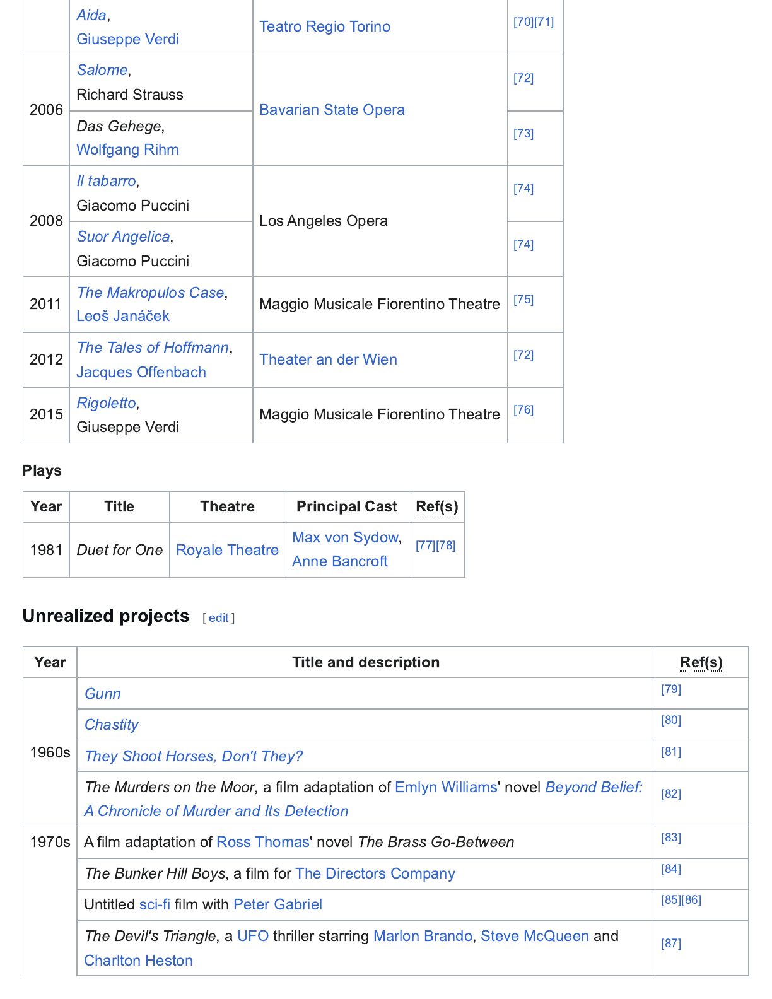

In [ ]:
idx = search_result.points[0].id
dataset[idx]["image"]

In [ ]:
def search_images_by_text(query_text, top_k=5):
    # Process and encode the text query
    with torch.no_grad():
        batch_query = colpali_processor.process_queries([query_text]).to(
            colpali_model.device
        )
        query_embedding = colpali_model(**batch_query)

    # Convert the query embedding to a list of vectors
    multivector_query = query_embedding[0].cpu().float().numpy().tolist()
    # Search in Qdrant
    search_result = qdrant_client.query_points(
        collection_name='demo', query=multivector_query, limit=top_k
    )

    return search_result


# Example usage
query_text = "Unrealized Project"
results = search_images_by_text(query_text)

for result in results.points:
    print(result)

id=18 version=0 score=11.376276523126464 payload={'source': 'internet archive'} vector=None shard_key=None order_value=None
id=1 version=0 score=7.845001091442573 payload={'source': 'internet archive'} vector=None shard_key=None order_value=None
id=8 version=0 score=7.453433830068118 payload={'source': 'internet archive'} vector=None shard_key=None order_value=None
id=7 version=0 score=7.085987342272559 payload={'source': 'internet archive'} vector=None shard_key=None order_value=None
id=2 version=0 score=6.659273578001289 payload={'source': 'internet archive'} vector=None shard_key=None order_value=None


In [ ]:
def search_by_text_and_return_images(query_text, top_k=5):
    results = search_images_by_text(query_text, top_k)
    row_ids = [r.id for r in results.points]
    return dataset.select(row_ids)

Image {'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1224x1584 at 0x7E3D91D65310>}


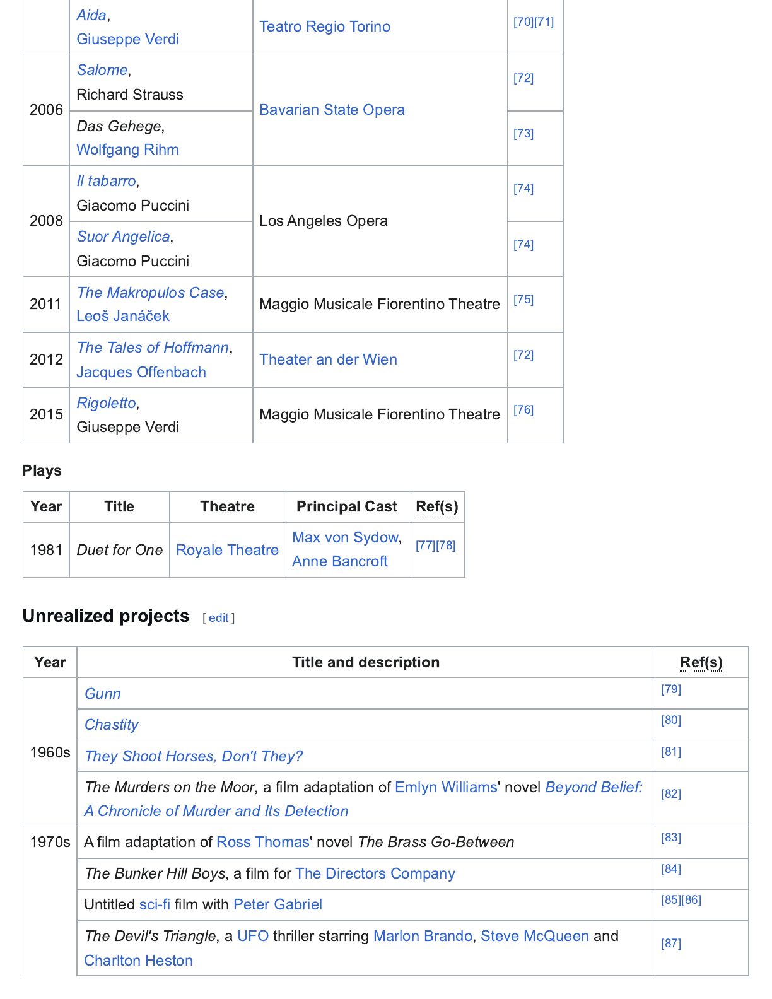

Image {'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1224x1584 at 0x7E3D91A64710>}


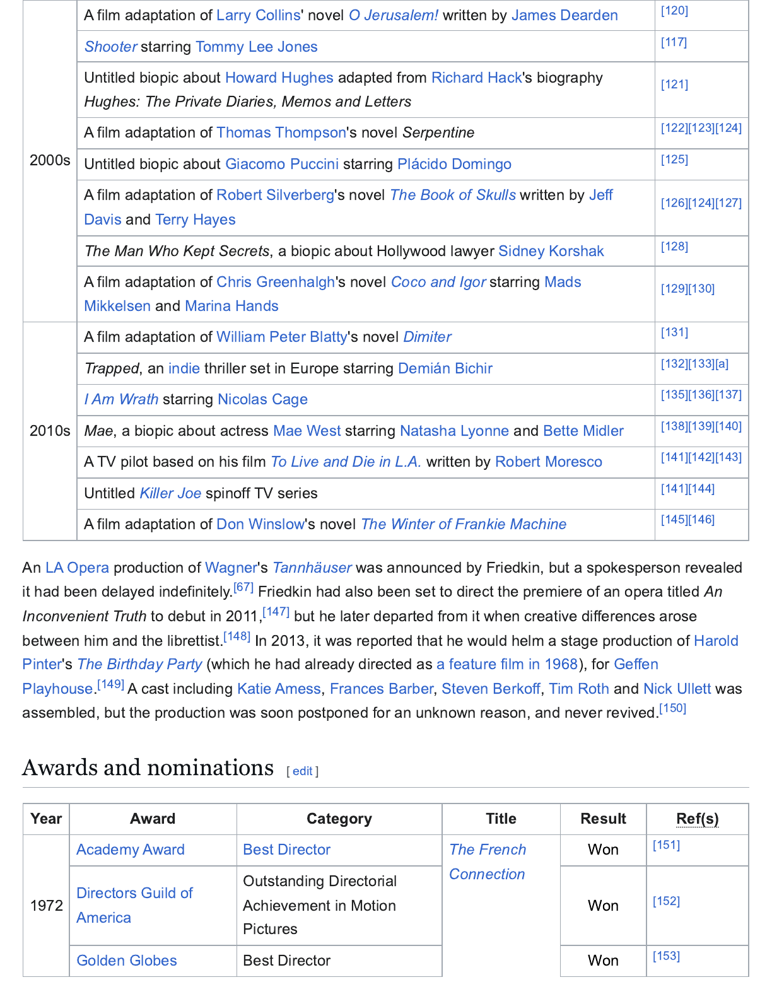

Image {'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1224x1584 at 0x7E3D9BC59D50>}


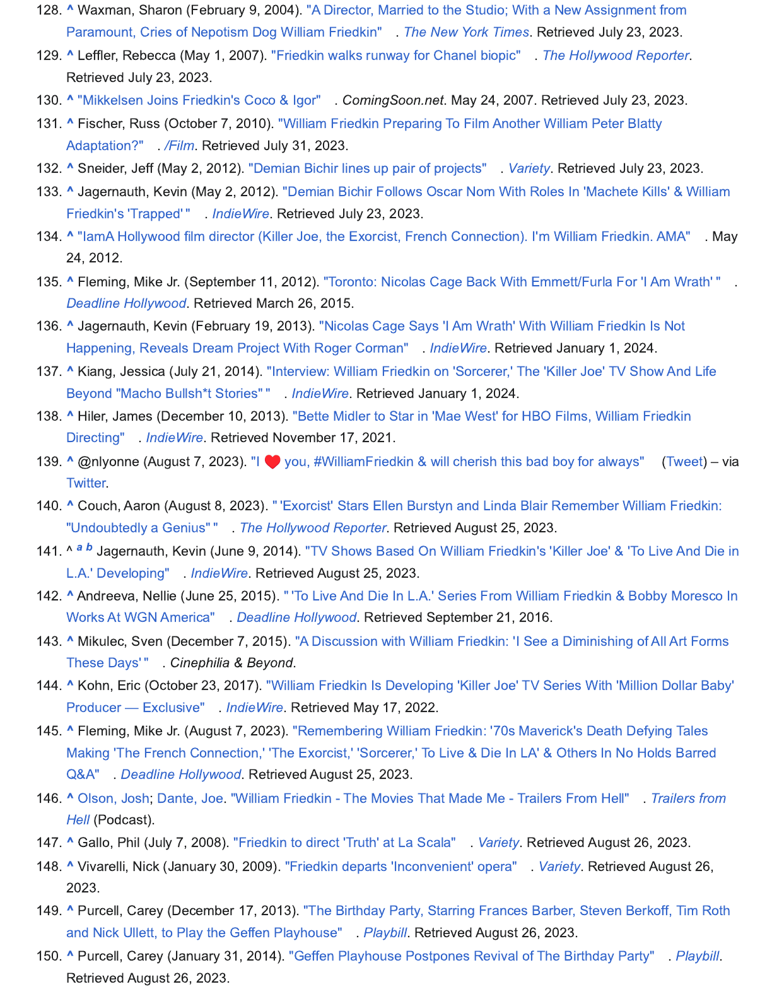

Image {'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1224x1584 at 0x7E3D7BF382D0>}


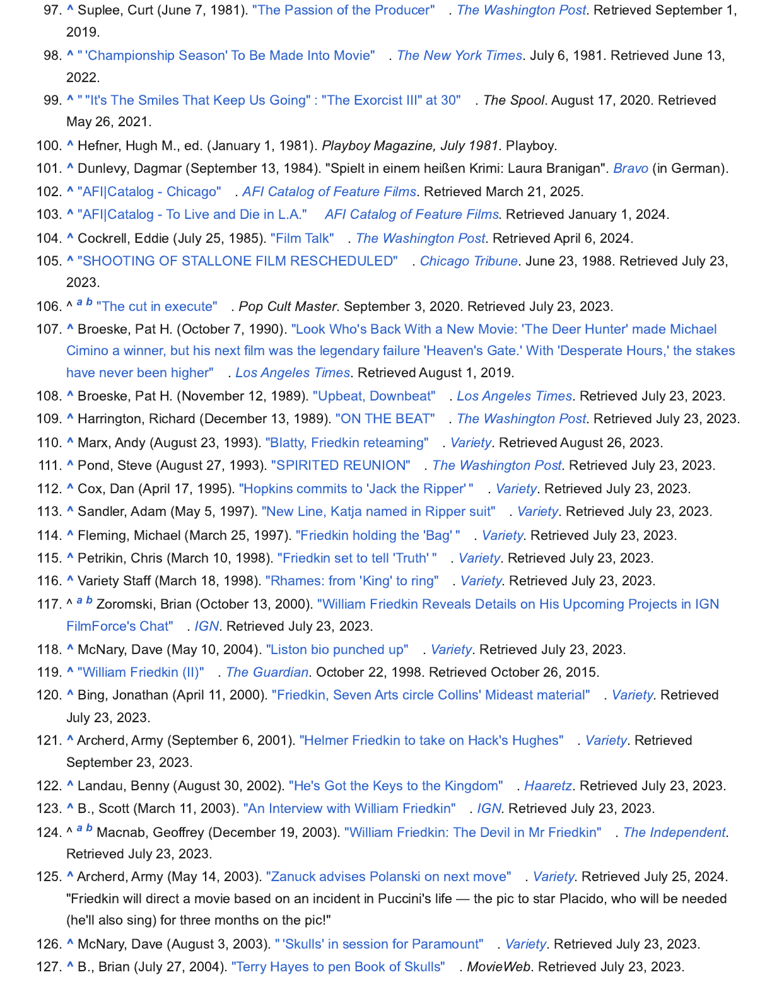

Image {'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1224x1584 at 0x7E3D7BF3B990>}


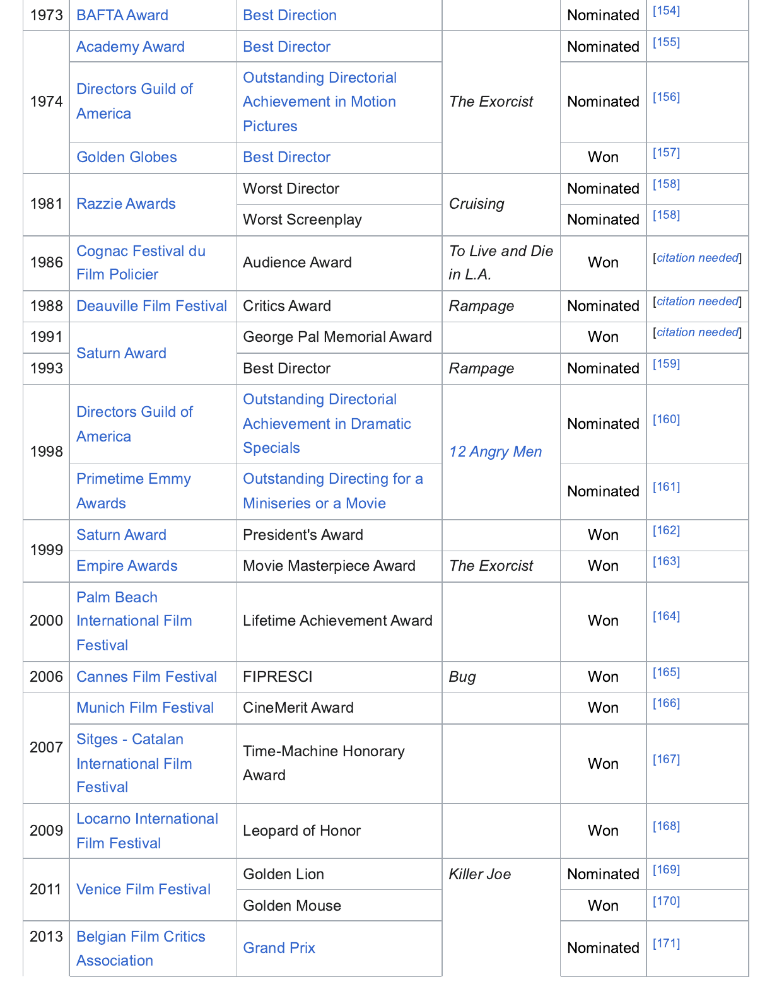

In [ ]:
results_ds = search_by_text_and_return_images("Unrealized Project")

for row in results_ds:
    # display image
    print(f"Image {row}")
    display(row["image"])

In [ ]:
from PIL import Image
from colpali_engine.interpretability import (
    get_similarity_maps_from_embeddings,
    plot_all_similarity_maps,
)


In [ ]:
!pip install colpali-engine[interpretability]

In [ ]:
from colpali_engine.interpretability import (
    get_similarity_maps_from_embeddings,
    plot_all_similarity_maps,
    plot_similarity_map
)

In [ ]:
from PIL import Image # Ensure Image is imported if not already
import torch # Assuming torch is used as per your context

query_text = 'I want to see Unrealized Projects'

# If you want to keep the variable name 'images' for the single image object:
image = results_ds[0]['image']

# Preprocess inputs
# The colpali_processor.process_images likely expects a list of PIL images.
batch_images = colpali_processor.process_images([image]).to(colpali_model.device)
batch_queries = colpali_processor.process_queries([query_text]).to(colpali_model.device)

with torch.no_grad():
  image_embeddings = colpali_model.forward(**batch_images)
  query_embeddings = colpali_model.forward(**batch_queries)

# n_patches calculation needs image_size from the PIL image object (images.size)
n_patches = colpali_processor.get_n_patches(image_size=images.size, patch_size=colpali_model.patch_size)
image_mask = colpali_processor.get_image_mask(batch_images) # This uses batch_images

# Generate the similarity maps
batched_similarity_maps = get_similarity_maps_from_embeddings(
    image_embeddings=image_embeddings,
    query_embeddings=query_embeddings,
    n_patches=n_patches,
    image_mask=image_mask,
)

# Get the similarity map for our (only) input image
similarity_maps = batched_similarity_maps[0]  # (query_length, n_patches_x, n_patches_y)

In [ ]:
import pprint
query_content = colpali_processor.decode(batch_queries.input_ids[0]).replace(colpali_processor.tokenizer.pad_token, "")
query_content = query_content.replace(colpali_processor.query_augmentation_token, "").strip()
query_tokens = colpali_processor.tokenizer.tokenize(query_content)

pprint.pprint({idx: val for idx, val in enumerate(query_tokens)})

{0: '<bos>',
 1: 'Query',
 2: ':',
 3: '▁I',
 4: '▁want',
 5: '▁to',
 6: '▁see',
 7: '▁Unreal',
 8: 'ized',
 9: '▁Projects'}


In [ ]:
# Choose a token using its index
token_idx = 7  # e.g. if "12: '▁Kazakhstan',", set 12 to choose the token 'Kazakhstan'

print(f"Selected token: `{query_tokens[token_idx]}`")

# Retrieve the similarity map for the chosen token
current_similarity_map = similarity_maps[token_idx]  # (n_patches_x, n_patches_y)

Selected token: `▁Unreal`


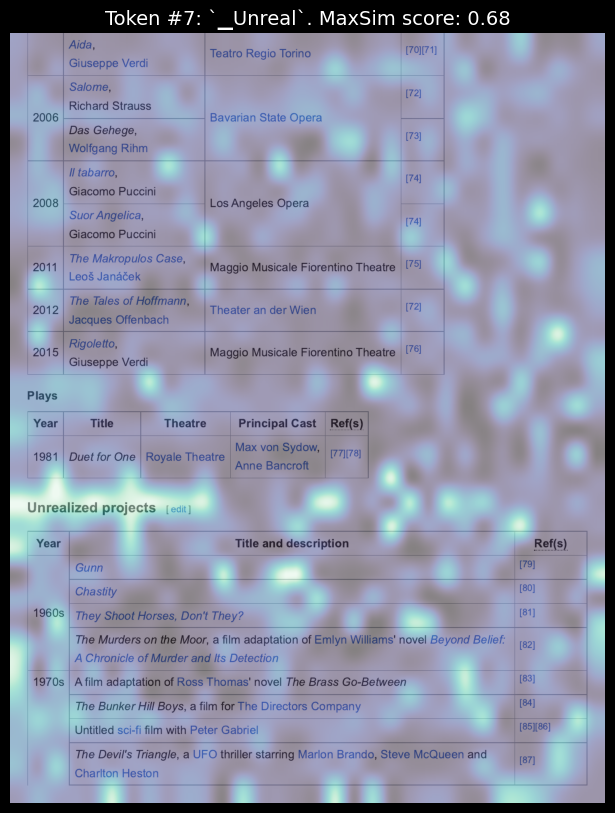

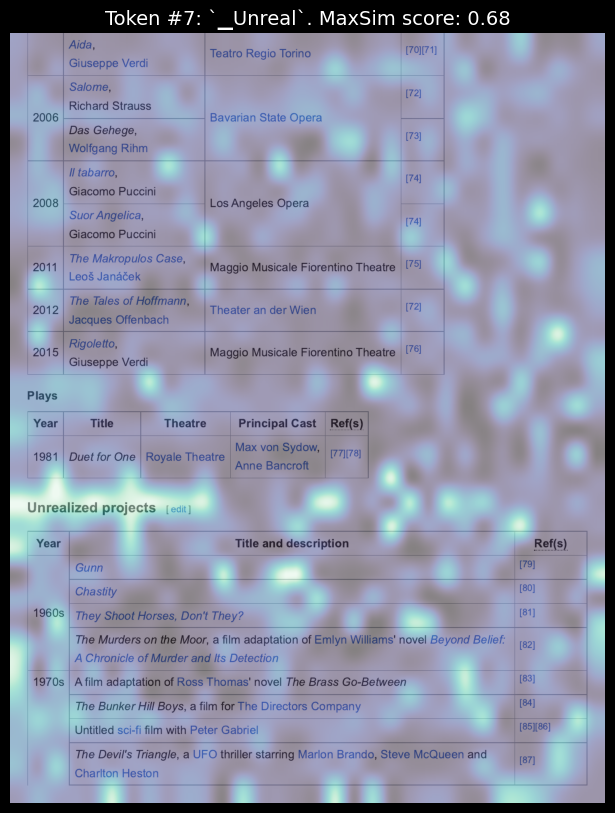

In [ ]:
fig, ax = plot_similarity_map(
    image=image,
    similarity_map=current_similarity_map,
    figsize=(8, 8),
    show_colorbar=False,
)

max_sim_score = similarity_maps[token_idx, :, :].max().item()
ax.set_title(f"Token #{token_idx}: `{query_tokens[token_idx]}`. MaxSim score: {max_sim_score:.2f}", fontsize=14)

fig

Similarity map for token `<bos>` saved at `similarity_map_0.png`
Similarity map for token `Query` saved at `similarity_map_1.png`
Similarity map for token `:` saved at `similarity_map_2.png`
Similarity map for token `▁I` saved at `similarity_map_3.png`
Similarity map for token `▁want` saved at `similarity_map_4.png`
Similarity map for token `▁to` saved at `similarity_map_5.png`
Similarity map for token `▁see` saved at `similarity_map_6.png`
Similarity map for token `▁Unreal` saved at `similarity_map_7.png`
Similarity map for token `ized` saved at `similarity_map_8.png`
Similarity map for token `▁Projects` saved at `similarity_map_9.png`


NameError: name 'plt' is not defined

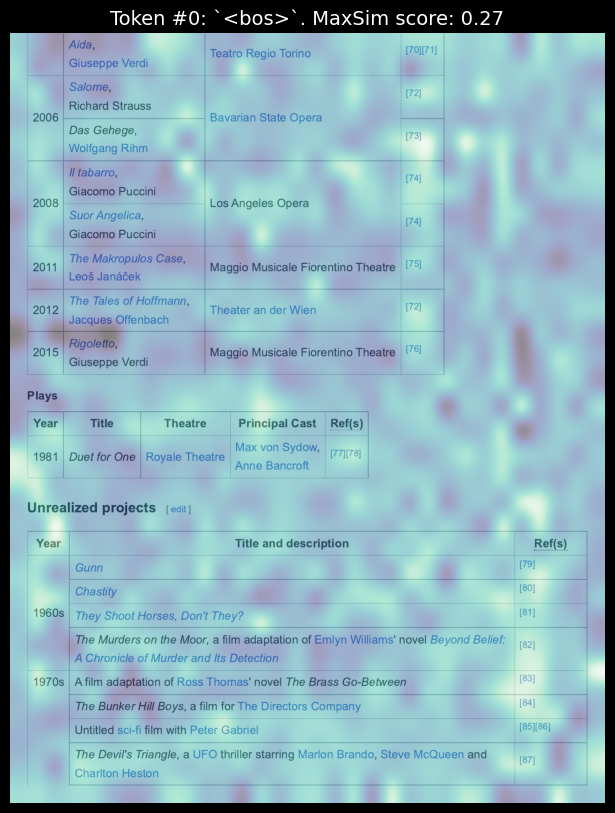

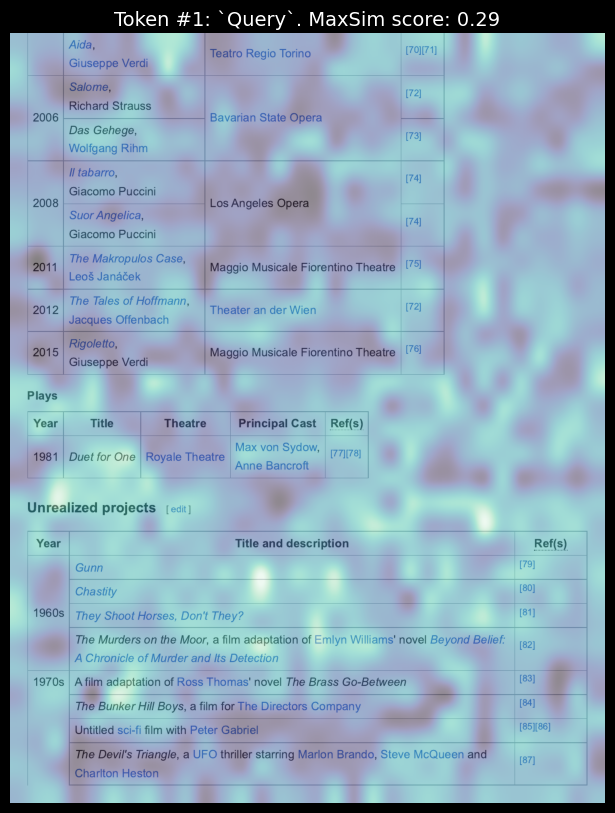

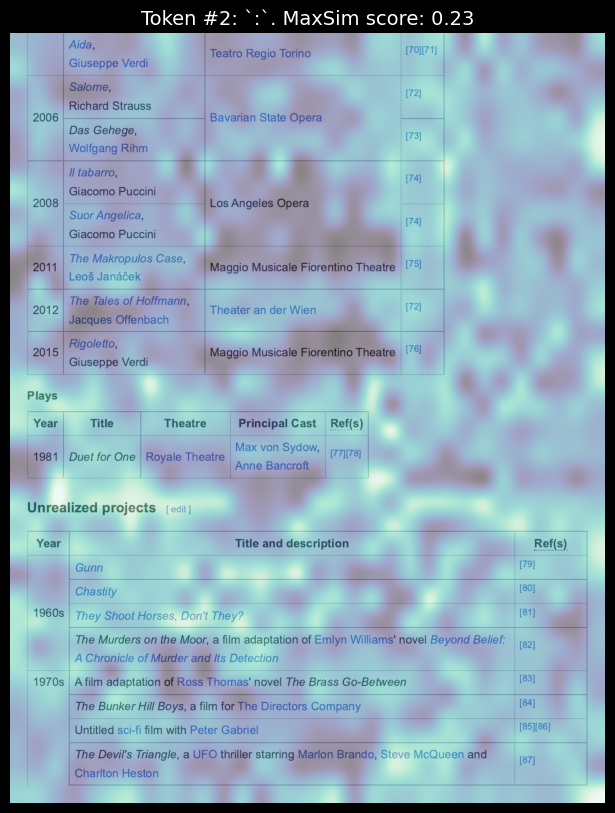

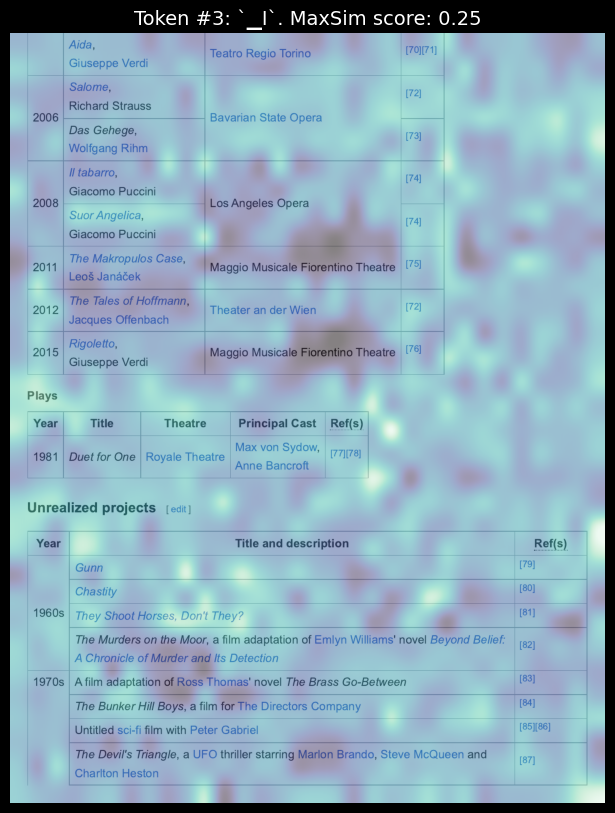

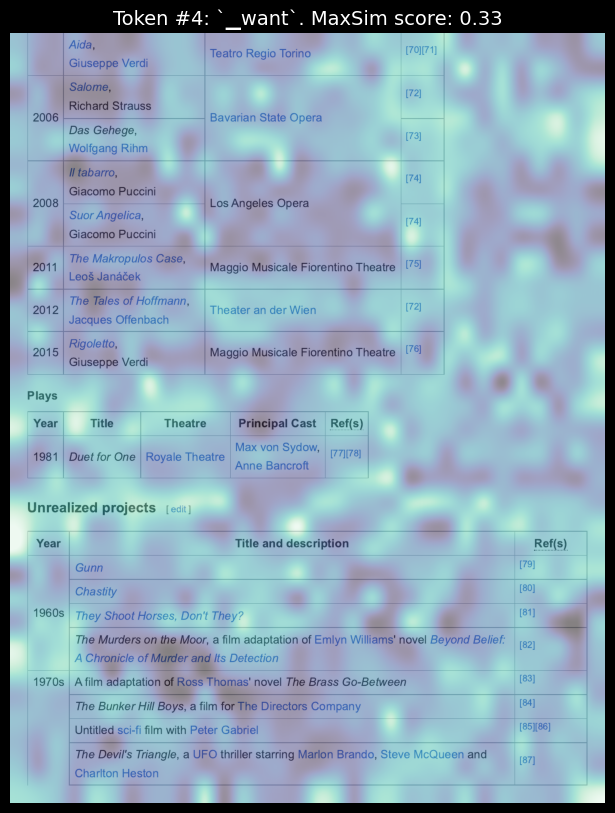

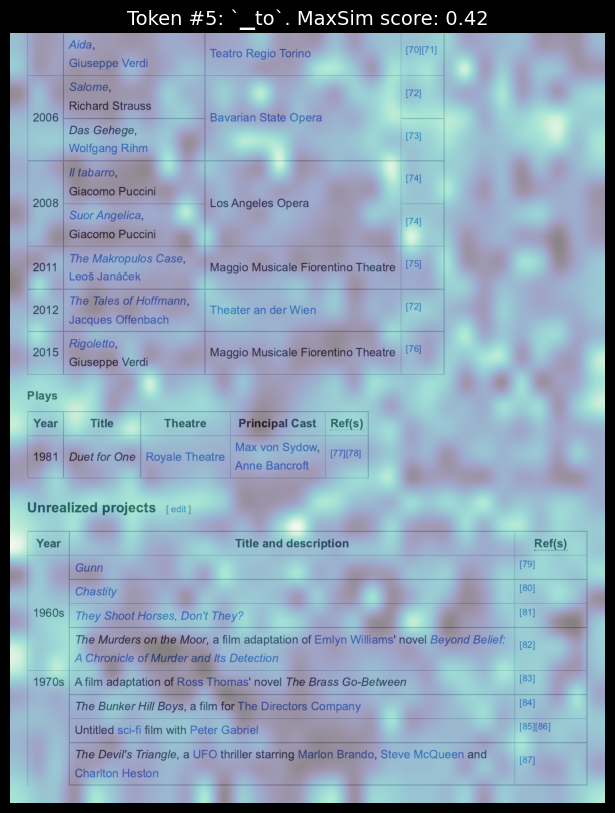

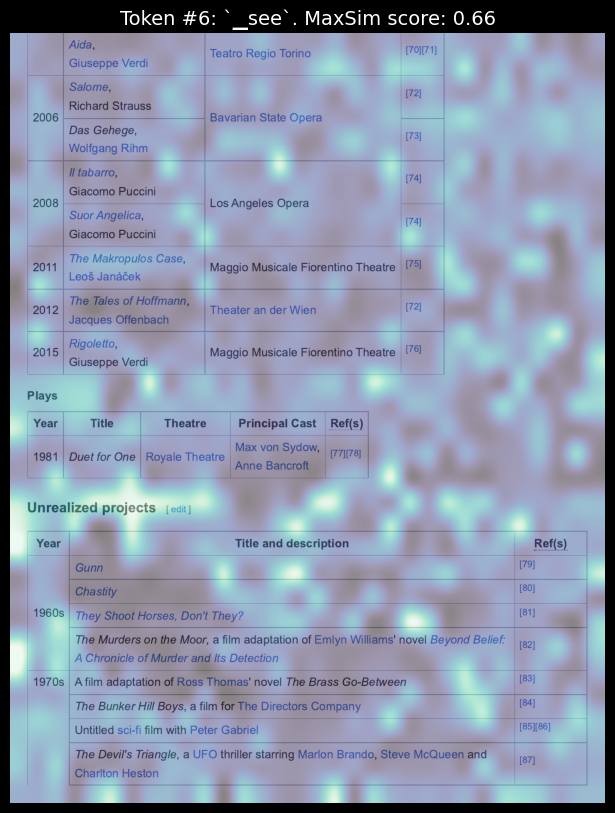

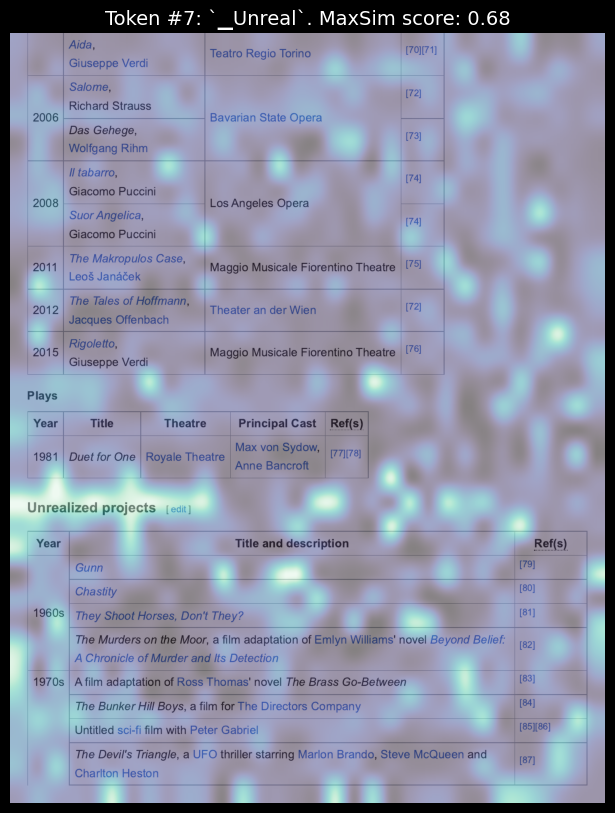

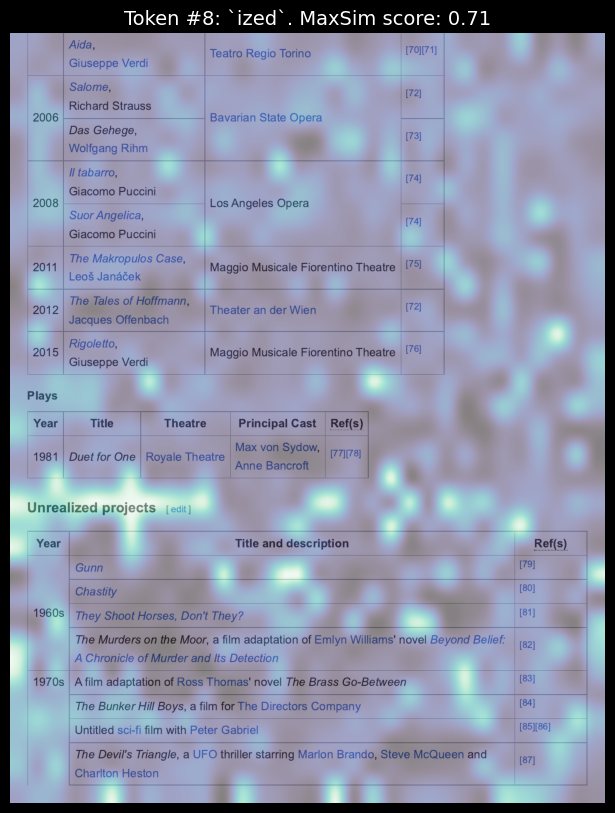

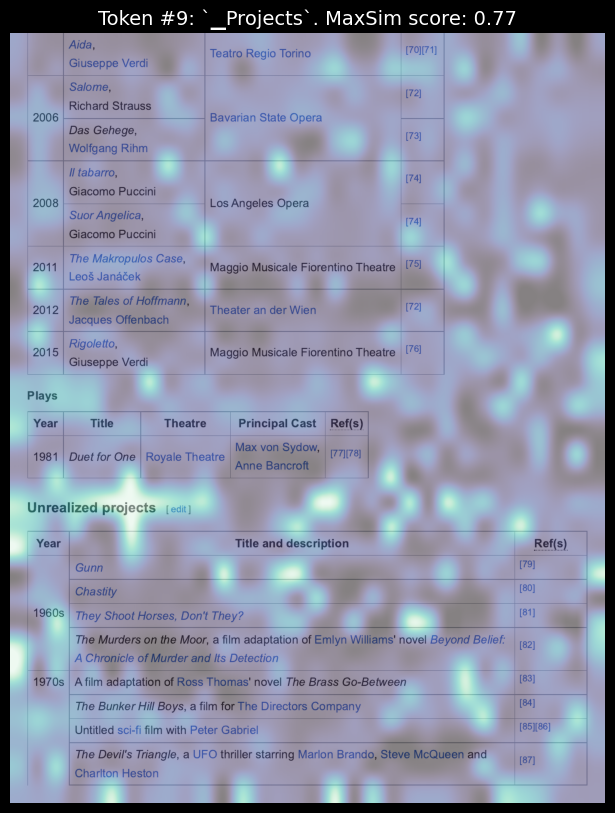

In [ ]:
plots = plot_all_similarity_maps(
    image=image,
    query_tokens=query_tokens,
    similarity_maps=similarity_maps,
    figsize=(8, 8),
    show_colorbar=False,
    add_title=True,
)

import matplotlib.pyplot as plt

for idx, (fig, ax) in enumerate(plots):
    savepath = f"similarity_map_{idx}.png"
    fig.savefig(savepath, bbox_inches="tight")
    print(f"Similarity map for token `{query_tokens[idx]}` saved at `{savepath}`")

plt.close("all")